# Исследование рынка заведений общественного питания Москвы

# Содержание

1. [Описание и задачи исследования](#description)
2. [Открытие данных](#start)
3. [Предобработка данных](#preprocessing)
    * [Обработка дубликатов](#duplicates)
    * [Обработка пропущенных значений](#null)
    * [Обработка аномальных значений](#anomalies)
    * [Добавление новых столбцов](#new_columns)
    * [Вывод](#3_5)
4. [Анализ данных](#analysis)
    * [Количество объектов общественного питания по категориям](#4_1)
    * [Количество посадочных мест](#4_2)
    * [Соотношение сетевых и несетевых заведений](#4_3)
    * [Топ-15 сетей в Москве](#4_4)
    * [Распределение категорий по округам](#4_5)
    * [Распределение средних рейтингов по категориям](#4_6)
    * [Хороплет со средний рейтингом заведений по округам](#4_7)
    * [ Кластеры заведений на карте](#4_8)
    * [Топ-15 улиц по количеству заведений](#4_9)
    * [Улицы с одним объектом общепита](#4_10)
    * [Средний счет по округам](#4_11)
    * [Вывод](#4_12)
5. [Исследование рынка общественного питания в сегменте кофеен](#coffee")
    * [Количество кофеен](#5_1)
    * [Круглосуточные кофейни](#5_2)
    * [Рейтинги кофеен](#5_3)
    * [Топ-15 сетей в Москве](#5_4)
    * [Распределение категорий по округам](#5_5)
    * [Вывод](#5_6)

## Описание и задачи исследования <a id="#description"></a>

# Цель исследования

Изучить рынок заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

# Источник данных

Мы будем работать с данными на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

# Описание данных

Файл `moscow_places.csv`:  
- `name` — название заведения;  
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»;
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»;
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым — 1 или нет — 0 (для маленьких сетей могут встречаться ошибки);
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

# Задачи исследования

1. Исследовать количество объектов общественного питания и посадочных по категориям: рестораны, кофейни, пиццерии, бары и так далее.

3. Изучить и визуализировать соотношение сетевых и несетевых заведений. Каких заведений больше? Какие категории заведений чаще являются сетевыми?

4. Найти топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

5. Проанализировать доли административных районов Москвы, и отобразить общее количество заведений и количество заведений каждой категории по районам.

6. Изучить аспределение средних рейтингов по категориям заведений.

7. Найдите топ-15 улиц по количеству заведений.

8. Изучить средние чеки по районам.

9. Определить влияет ли удалённость от центра на цены в заведениях?

## Открытие данных <a id="#start"></a>

Импортируем все необходимые нам библиотеки и настройки `Pandas` для отображения данных при выводе:

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=True)
import urllib



pd.pandas.set_option('display.max_columns', None) #отобразим все колонки таблицы
#округлим числовые значения до сотых, дабы избержать экспоненциального формата данных
pd.options.display.float_format = '{:,.2f}'.format
plt.rcParams["axes.formatter.limits"] = (-99, 99) #disable scientific notation on axes
sns.set(rc={'figure.figsize':(10, 7)})
# загружаем JSON-файл с границами округов Москвы
jsonurl = urllib.request.urlopen('https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson')
state_geo = json.loads(jsonurl.read())

Прочитаем файл `moscow_places.csv` из папки `/datasets` и сохраним его в переменной df.

In [ ]:
path = '/datasets/'
web_path = '****'
data = 'moscow_places.csv'

try:
    raw_df = pd.read_csv(path + data)
except:
    raw_df = pd.read_csv(web_path + data)

Выведем на экран 5 случайных строк таблицы:

In [ ]:
raw_df.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2056,"Кофе, пекарня",кофейня,"Москва, Огородный проезд, 10",Северо-Восточный административный округ,"пн-пт 09:00–21:00; сб,вс 09:00–18:00",55.81,37.60,4.10,NaN,NaN,NaN,NaN,0,NaN
7255,Coffee Gate,кафе,"Москва, Каширское шоссе, 3, корп. 2, стр. 4",Южный административный округ,NaN,55.67,37.63,3.70,NaN,NaN,NaN,NaN,0,40.00
5080,VASILCHUKÍ Chaihona №1,ресторан,"Москва, улица Большая Полянка, 56, стр. 1",Центральный административный округ,"ежедневно, 11:00–06:00",55.73,37.62,4.40,выше среднего,Средний счёт:от 1500 ₽,"1,500.00",NaN,1,430.00
3799,Хинкальный дворик,ресторан,"Москва, улица Литвина-Седого, 10с2",Центральный административный округ,"ежедневно, 11:00–00:00",55.76,37.54,4.40,средние,Средний счёт:600–1000 ₽,800.00,NaN,0,NaN
4656,Кулинарная лавка братьев Караваевых,кафе,"Москва, Спартаковская улица, 16",Центральный административный округ,"ежедневно, 08:00–23:00",55.77,37.68,4.40,средние,Средний счёт:300–800 ₽,550.00,NaN,1,70.00


In [ ]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вывод

Проблем с типами данных не наблюдается, но в некоторых столбцах присутствуют пропуски, которые следует проанализировать и решить, что с ними делать.

## Предобработка данных <a id="#preprocessing"></a>

In [ ]:
df = raw_df.copy()

### Обработка дубликатов <a id="#duplicates"></a>

In [ ]:
print('Количество дубликатов:', df.duplicated().sum(), 'из',  df.shape[0])

Количество дубликатов: 0 из 8406


Явные дубликаты в датафрейме отсутсвуют.

In [ ]:
df.nunique()

name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64

Проверим категориальные столбцы на неявные дубликаты, логично сделать это для столбцов `name` и `adress`.

In [ ]:
df.duplicated(subset= ['name','address'])

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403    False
8404    False
8405    False
Length: 8406, dtype: bool

Для данного исследования неявные дубликаты допустимы по отдельным колонкам, т.к. заведения могут располагаться на одной улице, в одном торгом центре или просто в одном месте, также они могут быть сетевыми и иметь схожие средние чеки.

### Обработка пропущенных значений <a id="#null"></a>

In [ ]:
pd.concat([df.isna().sum(), df.isna().mean()],
          axis=1, keys=['sum', 'conversation']).style.format({'conversation': '{:.2%}'}).background_gradient('coolwarm')

,sum,conversation
name,0,0.00%
category,0,0.00%
address,0,0.00%
district,0,0.00%
hours,536,6.38%
lat,0,0.00%
lng,0,0.00%
rating,0,0.00%
price,5091,60.56%
avg_bill,4590,54.60%


В данных присутсвует достаточно много пропусков среди категориальных переменных. Эти пропуски могут быть вызваны тем, что данные не были внесены пользователями или уполномоченными лицами, связанными с заведениям, в Яндекс Карты или Яндекс Бизнес. Однако, релевантные данные для заполнения пропусков отсутствуют, поэтому оставим их как есть, чтобы не искажать результаты исследования.

### Обработка аномальных значений <a id="#anomalies"></a>

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
lat,"8,406.00",55.75,0.07,55.57,55.71,55.75,55.80,55.93
lng,"8,406.00",37.61,0.10,37.36,37.54,37.61,37.66,37.87
rating,"8,406.00",4.23,0.47,1.00,4.10,4.30,4.40,5.00
middle_avg_bill,"3,149.00",958.05,"1,009.73",0.00,375.00,750.00,"1,250.00","35,000.00"
middle_coffee_cup,535.00,174.72,88.95,60.00,124.50,169.00,225.00,"1,568.00"
chain,"8,406.00",0.38,0.49,0.00,0.00,0.00,1.00,1.00
seats,"4,795.00",108.42,122.83,0.00,40.00,75.00,140.00,"1,288.00"


Значения выглядят реалистичными и почти не вызывают сомнений, но стоит обратить внимание на поля `middle_avg_bill` и `seats`, где минимальное значение равно `0`, очень странно. Также поле `seats` вызывает сомнение, т.к. максимальное значение составляет `1288`, скорей всего это конференц-залы или ресторанные кмоплексы, расположенные в гостиницах, которые не несут ценности при анализе.

In [ ]:
df.query('middle_avg_bill == 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.75,37.59,4.50,высокие,Средний счёт:от 0 ₽,0.00,NaN,1,200.00


Одно значение ни на что не повлияет, позже мы его удалим.

In [ ]:
df.query('seats == 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.50,NaN,Средний счёт:300 ₽,300.00,NaN,0,0.00
177,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.88,37.56,4.00,NaN,NaN,NaN,NaN,1,0.00
196,Донер-Шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.50,NaN,NaN,NaN,NaN,0,0.00
203,Тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.00,NaN,NaN,NaN,NaN,1,0.00
211,Неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.89,37.60,4.30,NaN,NaN,NaN,NaN,0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8118,Бико,булочная,"Москва, улица Симоновский Вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.72,37.66,1.30,NaN,NaN,NaN,NaN,0,0.00
8168,Чайхана УЧ Кудук,кофейня,"Москва, улица Симоновский Вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.72,37.66,4.30,NaN,NaN,NaN,NaN,0,0.00
8172,Масса кофе,кофейня,"Москва, Холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.71,37.62,4.30,средние,Цена чашки капучино:100–210 ₽,NaN,155.00,0,0.00
8336,Сочная шаурма в Кузьминках,быстрое питание,"Москва, Волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.70,37.77,3.90,NaN,Средний счёт:120–130 ₽,125.00,NaN,0,0.00


In [ ]:
print('Доля заведений с нулевыми посадочными местами:', round(len(df.query('seats == 0'))/df['seats'].count(), 2))

Доля заведений с нулевыми посадочными местами: 0.03


Мы могли бы попробовать поискать информацию о посадочных местах в этих заведениях из открытых источников, либо обзвонить или сходить в них, но подобная аномалия наблюдается лишь в `0.03%` от общего количества заведений, поэтому мы оставим все как есть, ведь теоретически многие из них действительно могут не иметь посадочных мест, т.к. работают навынос.

По данным от сервиса `Zoon` самый большой ресторан Москвы может вместить до 500 мест при банкетной рассадке, обычно зал вмещает до `180`, но в основном среди крупных - до `300` мест.

In [ ]:
print('Кол-во заведений свыше 500 посадочных мест:', len(df.query('seats > 500')))

Кол-во заведений свыше 500 посадочных мест: 56


Скорее всего в информации об этих заведениях было указано число посадочных мест при фуршетной рассадке. В таком случае, можно сократить датасет, убрав заведения, имеющие более `500` посадочных мест.

In [ ]:
df = df.query('seats.isna() | seats <= 500 & middle_avg_bill > 0 | middle_avg_bill.isna()')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,0,86.00
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.64,37.66,4.80,NaN,NaN,NaN,NaN,0,150.00
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,3.90,NaN,Средний счёт:от 150 ₽,150.00,NaN,0,150.00
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,4.20,NaN,NaN,NaN,NaN,1,150.00


Посмотрим вновь на присутстсвие аномалий:

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
lat,"8,387.00",55.75,0.07,55.57,55.71,55.75,55.80,55.93
lng,"8,387.00",37.61,0.10,37.36,37.54,37.61,37.66,37.87
rating,"8,387.00",4.23,0.47,1.00,4.10,4.30,4.40,5.00
middle_avg_bill,"3,130.00",956.41,"1,010.74",30.00,375.00,750.00,"1,250.00","35,000.00"
middle_coffee_cup,535.00,174.72,88.95,60.00,124.50,169.00,225.00,"1,568.00"
chain,"8,387.00",0.38,0.49,0.00,0.00,0.00,1.00,1.00
seats,"4,776.00",105.84,114.51,0.00,40.00,75.00,133.00,"1,288.00"


Теперь аномальные значения отсутствуют и описание датасета выглядит приемлемо.

### Добавление новых столбцов <a id="#new_columns"></a>

Создадим столбец `street` с названиями улиц из столбца с адресом `address`.

In [ ]:
df.insert(3, 'street', df['address'].str.split(', ').apply(lambda x: x[1]), True)
df.head()

,name,category,address,street,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",улица Дыбенко,Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко,Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Клязьминская улица,Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко,Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Правобережная улица,Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7) - логическое значение `True`, в противоположном случае - `False`.

Для начала создадим функцию, которая будет проверять наличие ключевых слов и присваивать соответсвующее логическое значение.

In [ ]:
def check_24(value):
    try:
        if ('круглосуточно' in value) and ('ежедневно' in value):
            return True
        return False
    except:
        return False

Мы прибегли к конструкции `try-except`, т.к. в некоторых значиниях колонки `hours` встречались `NaN`. Теперь применим её:

In [ ]:
df.insert(6, 'is_24/7', df['hours'].apply(check_24), True)
df.head()

,name,category,address,street,district,hours,is_24/7,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",улица Дыбенко,Северный административный округ,"ежедневно, 10:00–22:00",False,55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко,Северный административный округ,"ежедневно, 10:00–22:00",False,55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Клязьминская улица,Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False,55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко,Северный административный округ,"ежедневно, 09:00–22:00",False,55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Правобережная улица,Северный административный округ,"ежедневно, 10:00–22:00",False,55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


### Вывод <a id="#3_5"></a>

Явные дубликаты в данных отсутсвуют, а неявные дубликаты допустимы, т.к. заведения могут располагаться на одной улице, в одном торгом центре или просто в одном месте, также они могут быть сетевыми и иметь схожие средние чеки.

Столбцы `middle_avg_bill`, `middle_coffee_cup`, `hours`, `price`, `avg_bill` и `seats` имеют пропуски, но эта информация уникальна и не может быть восстановлена с помощью какого-либо метода через остальные данные, т.к. фактическая информация исказится, поэтому мы не стали заполнять их какими-либо значениями и оставили как есть.

Также были убраны аномальные значения в столбце с посадочными местами `seats`, после было принято решение оставить в датасете только заведения, имеющие до `500` посадочных мест.

Добавили новые столбцы: названиями улиц из столбца с адресом `street`, обозначением, что заведение работает ежедневно и круглосуточно (24/7) `is_24/7`.

## Анализ данных <a id="#analysis"></a>

### Количество объектов общественного питания по категориям <a id="#4_1"></a>

Исследуем количество объектов общественного питания по категориям.

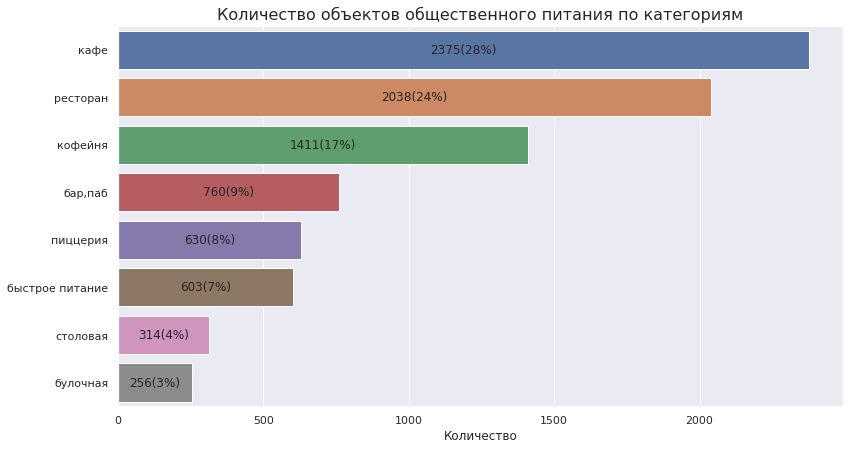

In [ ]:
figure, category_bar = plt.subplots(figsize=(13, 7))
sns.barplot(x = df["category"].value_counts(), y = df["category"].value_counts().index, ax = category_bar)
category_bar.set_xlabel('Количество')
category_bar.set_title('Количество объектов общественного питания по категориям', fontsize = 16)

for patch in category_bar.patches:
    label_x = patch.get_x() + patch.get_width()/2
    label_y = patch.get_y() + patch.get_height()/2
    category_bar.text(label_x, label_y,
                #отображение количества объектов в виду процентов
               str(int(patch.get_width())) + '(' +
               '{:.0%}'.format(patch.get_width()/len(df.category))+')',
               horizontalalignment='center', verticalalignment='center')

Для большей наглядности также построим круговую диаграмму, чтобы рассмотреть соотношение со стороны.

In [ ]:
fig = go.Figure(data=[go.Pie(labels=df['category'].value_counts().index, values=df['category'].value_counts(), sort = True)],
                layout=go.Layout(title=go.layout.Title(text="Соотношение объектов общественного питания по категориям")))
fig.update_layout(
    title_x = 0.5,
    legend=dict(
    y=1,
    x=0.8))
fig.show()

Наибольшея доля объектов общественного питания приходится на кафе и составляет `2375` заведений `(28,3%)`, после с разницей `4%` следуют рестораны — `2038` заведений `(24,3%)`, топ-3 замыкают кофейни — `1411` заведений `(16,8%)`. Самым малочисленным форматом оказались булочные — `256` заведений `(3,05%)`.

### Количество посадочных мест <a id="#4_2"></a>

Исследуем количество посадочных мест в местах по категориям. Для начала составим сводную таблицу со средними и медианными значениями, чтобы посмотреть картину в целом.

In [ ]:
(pd
 .pivot_table(df,
              index='category',
              values='seats',
              aggfunc=['mean', 'median'])
 .reset_index()
 .droplevel(1, axis=1)
 .sort_values(by='mean', ascending=False)
 .style
 .background_gradient('YlGn')
)

,category,mean,median
6,ресторан,118.907510,86.000000
0,"бар,паб",116.809935,80.000000
4,кофейня,110.395194,80.000000
2,быстрое питание,98.891117,65.000000
3,кафе,96.230453,60.000000
7,столовая,93.000000,75.000000
5,пиццерия,90.742925,52.000000
1,булочная,89.385135,50.000000


Для большей наглядности визуализируем колонку со средними значениями:

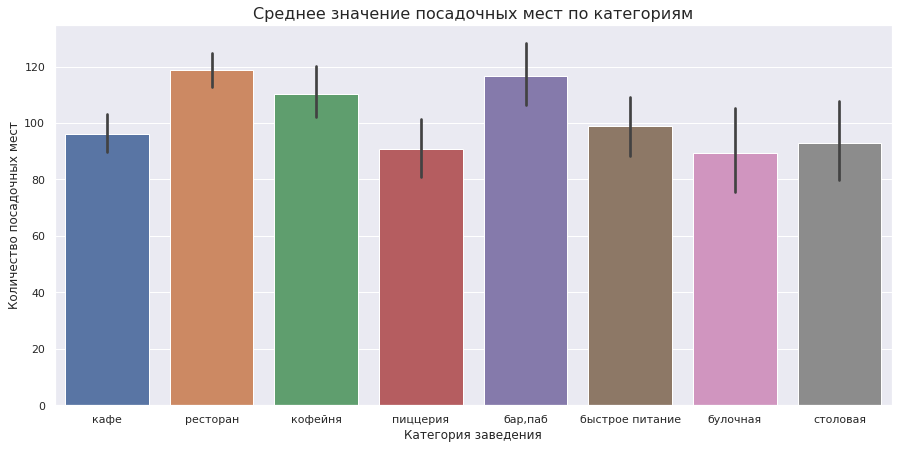

In [ ]:
from numpy import mean
plt.figure(figsize=(15, 7))
sns.barplot(x='category', y='seats', data=df, estimator=mean)
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.title('Среднее значение посадочных мест по категориям', fontsize = 16)
plt.show()

Больше всего посадочных мест в среднем имеют рестораны - `118` мест, бары и пабы - `116` места,  и кофейни - `110` мест. По таблице также видно, что среднее значение и медиана сильно отличаются, что говорит о большом разбросе. Чтобы более изучить распределение значений по каждой категории мы используем диграмму размаха.

In [ ]:
fig = px.box(df,
             x="category",
             y="seats",
             range_y=[-10, 520],
             color="category")
fig.update_layout(
    title={
        'text': 'Диаграмма размаха посадочных мест по категориям',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Количество посадочных мест',
        xaxis_title='Категория заведения')
fig.show()

На диаграмме можно увидеть, что заведения в каждой категории имеют более `240` мест. По медианным значениям лидерство занимают те же самые категории и имеют от `80` до `86` мест, однако, более 300 посадочных мест и самыми вместительными оказались: заведения быстрого питания (`320`), кофейни (`306`) и рестораны (`305`).

Меньше всего мест имеют булочные (`25`), заведения быстрого питания (`27`) и пеццерии (`30`), медианные значения в этих категориях колеблются от `50` до `65` мест, а средние от `120` до `140`.

Можно немного углубиться и посмотреть как обстоят дела с посадочными местами в разбивке по режиму работы заведений.

In [ ]:
fig = px.box(df, x="category", y="seats", range_y=[-10, 550], color='is_24/7')
fig.update_layout(
    title={
        'text': 'Диаграмма размаха посадочных мест в разрезе режима работы заведений',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Посадочные места',
        xaxis_title='Категория заведения')
newnames = {'False':'Не круглосуточно', 'True': 'Круглосуточно'}
fig.update_layout(legend_title_text="Режим работы")
fig.for_each_trace(lambda t: t.update(name = newnames[t.name]))
fig.show()

Наблюдается следующая законмерность: почти каждая категория, имеющая большое количество посадочных мест и при этом работающая в обычном режиме, имеет меньше посадочных мест в круглосуточном режиме, за исключением былочных (они более вместительны). Наиболее равномерные значения имеют кофейни, где разброс практически отсутсвует.

### Соотношение сетевых и несетевых заведений <a id="#4_3"></a>

Для начала исследуем общее соотношение заведей, а потом рассмотрим более подробно по каждой категории.

In [ ]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values= df['chain'].value_counts())], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.update_layout(
    title_x = 0.5,
    legend=dict(
    y=0.0,
    x=0.75))
fig.show()

Как оказалось, несетевых заведений больше, чем сетевых практически на четверть (`24%`) — `5190` объектов (`61,9%`) и `3197` объектов (`38,1%`) соотвественно. Такое соотношение ожидаемо и выглядит логично, ведь в России процветает малый бизнес, даже не смотря на некоторый спад в пиковые периоды пандемии. В качестве предпосылок можно выделить независимость от конкретных поставщиков, а также отсутсвие издержек в виде покупки франчайзи, паушальных взносов, роялти и других издержек, а также организационных обязательств, которые имеет сетевой тип бизнеса.

In [ ]:
chain_grouped = (pd
                 .pivot_table(df,
                              index='category',
                              columns='chain',
                              values='name',
                              aggfunc='count')
                 .reset_index()
                 .rename(columns={0:'not_chain',
                                  1:'chain'})
                 .sort_values(by='not_chain',
                              ascending=False))
fig = go.Figure()
fig.add_trace(go.Bar(
    x = chain_grouped['category'],
    y = chain_grouped['not_chain'],
    name='Несетевые заведения',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    x = chain_grouped['category'],
    y = chain_grouped['chain'],
    name='Сетевые заведения',
    marker_color='lightsalmon'
))
fig.update_layout(barmode='group', xaxis_tickangle=0)
fig.update_layout(
    title={
        'text': 'Соотношение сетевых и несетевых заведений по категориям',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Количество заведений',
        xaxis_title='Категория заведения')

fig.show()

По графику видно, что чаще всего являются сетевыми кафе и рестораны, это связано с тем, что заведений данных категорий в принципе больше всего. Также хотелось бы отметить, что примерно одинаковое соотношение имеют только кофейни и пиццерии, в остальных же категориях почти везде преобладают несетевые заведения:
 * Кафе и рестораны имеют разницу примерно в 2 раза.
 * Бары и пабы в 3,5 раза.
 * Столовые почти в 3 раза.

На удивление, булочные имеют на 50% больше сетевых заведений по отношению к несетевым.

### Топ-15 сетей в Москве <a id="#4_4"></a>

Первым делом создадим таблицу с наиболее популярными сетевыми заведениями в Москве.

In [ ]:
top_chains = (df[df['chain'] == 1]
              .groupby(['name'],
                       as_index=False)
              .agg({'address':'count'})
              .rename(columns={'address':'total'})
              .sort_values(by = 'total',
                           ascending=False)
              .head(15))
top_chains

,name,total
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,38


In [ ]:
chains_detailed = (pd
                   .pivot_table(df[df['chain'] == 1],
                                index='name',
                                values='address',
                                columns='category',
                                aggfunc='count')
                   .reset_index())
top_chains_merged = top_chains.merge(chains_detailed, on='name', how='left')
y = top_chains_merged['name']
fig = go.Figure(go.Bar(y=y, x=top_chains_merged['бар,паб'], name='бар,паб', orientation='h'))

for category in top_chains_merged.loc[:, 'булочная':'столовая']:
    fig.add_trace(go.Bar(y=y, x=top_chains_merged[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Распределение категорий заведений среди сетей питания',
        'xanchor': 'center',
        'y':0.9,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

Самой популярной в Москве оказалась сеть кофеен `Шоколадница`, которая насчитывает `120` точек, после идут 2 сети пиццерий: `Домино'с` (`76`) и `Додо` (`74`), далее следует еще одна кофейня `One Price Coffee`, имеющая `71` точку, замыкает пятерку лидеров всем известная `Яндекс Лавка`, имеющая `69` точек.

Наименее популярными окались: `Му-Му` (`27`), `CofeFest` и `Буханка`, последние имеют по `32` точки.

### Распределение категорий по округам <a id="#4_5"></a>

Для начала создадим таблицу и сгруппируем данные по округам и категориям.

In [ ]:
districts_detailed = (pd
                   .pivot_table(df,
                                index='district',
                                values='address',
                                columns='category',
                                aggfunc='count')
                    .sort_values(by='Центральный административный округ',
                                ascending=False,
                                axis=1)
                   .reset_index())
districts_detailed['total'] = districts_detailed.sum(axis=1)
districts_detailed = districts_detailed.sort_values(by='total', ascending=False)
(districts_detailed
 .style
 .set_caption('Распределение категорий по округам')
 .background_gradient('YlGn', axis=0))

category,district,ресторан,кафе,кофейня,"бар,паб",пиццерия,быстрое питание,столовая,булочная,total
5,Центральный административный округ,670,464,427,364,113,87,66,50,2241
8,Южный административный округ,202,264,131,68,73,85,44,25,892
3,Северо-Восточный административный округ,182,269,159,63,68,82,40,28,891
2,Северный административный округ,186,233,192,67,74,58,41,39,890
1,Западный административный округ,216,239,150,49,71,62,23,37,847
0,Восточный административный округ,160,272,105,50,72,71,40,25,795
6,Юго-Восточный административный округ,145,282,89,38,55,67,25,13,714
7,Юго-Западный административный округ,168,237,96,38,64,61,17,27,708
4,Северо-Западный административный округ,109,115,62,23,40,30,18,12,409


In [ ]:
fig = px.bar(districts_detailed,
             x='total', y='district', color='district', text='total', color_discrete_sequence=px.colors.qualitative.T10)
fig.update_layout(legend_title_text=None,
                  title={
                      'text': 'Количество заведений по районам',
                      'xanchor': 'center',
                      'y':0.95,
                      'x':0.5},
                  xaxis_title='Количество заведений',
                  yaxis_title='Административный округ')

fig.show()

Основная масса заведений, которых насчитывается `2241`, приходится на Центральный округ, что вполне логично, т.к. там наибольшая проходимость, раполагаются офисы крупных компаний, рядом достопримечательности, которые привлекают туристов и другие факторы. Если посмотреть на другие округа, то все они имеют меньшее `900` заведений - от `708` до `892`. Меньше всего заведений расположено в Северо-Западном административном округе - `409`.

Теперь более подробно изучим распределение категорий по округам.

In [ ]:
y = districts_detailed['district']
fig = go.Figure(go.Bar(y=y, x=districts_detailed['ресторан'], name='ресторан', orientation='h'))

for category in districts_detailed.loc[:, 'кафе':'булочная']:
    fig.add_trace(go.Bar(y=y, x=districts_detailed[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Распределение категорий заведений по округам Москвы',
        'xanchor': 'center',
        'y':0.9,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

По графику видно, что практически везде преобладают кафе, рестораны и кофейни, если акцентировать внимание на отдельных округах, то можно сделать такие выводы:
* В ЦАО лидируют рестораны `670` заведений;
* В остальных округах все немного иначе, там больше всего кафе, а рестораны уже занимают вторую строчку, исключением является лишь СЗАО, где все практически равно из-за небольшого количества заведений в принципе;
* Также стоит заметить, что во всех округах довольно мало баров и пабов по отношению к Центральному округу.

### Распределение средних рейтингов по категориям <a id="#4_6"></a>

Для начала состам таблицу со средними рейтингами в каждой категории.

In [ ]:
rating_by_category = df.groupby('category', as_index=False).agg({'rating':'mean'}).sort_values(by='rating', ascending=False)
rating_by_category

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [ ]:
fig = px.bar(rating_by_category, x='category', y='rating', color='category')
fig.update_layout(legend_title_text=None,
                  title='Средний рейтинг заведений по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Средний рейтинг',
                  yaxis_range=[4,4.45])

fig.show()

Из графики и таблицы видно, что наивысший средний рейтинг имеют бары и пабы - `4,39` балла, следом за ними идут пиццерии, рестораны, кофейни и булочных которые имеют от `4,27` до `4,29`, разрыв в данных категориях по `0,1` балла. Наименьший рейтинг имеет категория "быстрого питания" - `4,05` балла. Можно подумать, что все хорошо раз все категории имеют оценки выше `4` баллов, но это было бы ошибкой, т.к. это средние оценки, поэтому мы сделаем диаграмму размаха и рассмотрим рейтинг более детально.

In [ ]:
fig = px.box(df, x="rating", color="category")
fig.update_layout(legend_title_text=None,
                 title={
                      'text': 'Распределение рейтингов по категориям',
                      'xanchor': 'center',
                      'y':0.95,
                      'x':0.5},
                  xaxis_title='Количество',
                  yaxis_title='Рейтинг')
fig.show()

Мало что изменилось, т.к. самые нижние границы "ящика с усами" имеют заведения `"быстрого питания"`, а наилучше в плане распределения оценок показывает категория `бары и пабы`.

### Хороплет со средний рейтингом заведений по округам <a id="#4_7"></a>

Для начала создамим сводную таблицу со средними рейтингами по округам.

In [ ]:
rating_districts = pd.pivot_table(df,
                           index='district',
                           values='rating',
                           aggfunc='median').reset_index()
(rating_districts
 .sort_values(by='rating',
              ascending=False)
 .style
 .set_caption('Cредний рейтинг заведений по округам')
 .background_gradient('YlGn', axis=0))

,district,rating
5,Центральный административный округ,4.400000
0,Восточный административный округ,4.300000
1,Западный административный округ,4.300000
2,Северный административный округ,4.300000
4,Северо-Западный административный округ,4.300000
7,Юго-Западный административный округ,4.300000
8,Южный административный округ,4.300000
3,Северо-Восточный административный округ,4.200000
6,Юго-Восточный административный округ,4.200000


In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_districts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m


По фоновой картограмме видно, что заведения с наиболее высоким средним рейтингом находятся в Центральном округе - `4,4` балла, а наименьший рейтинг (`4,2`) имеют Северо-Восточный и Юго-Восточный округа.

### Кластеры заведений на карте <a id="#4_8"></a>

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}  {row['category']}  {row['rating']} ",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Выводы мы делали ранее и с ними можно ознакомиться в главе [4.5](#4_5).

### Топ-15 улиц по количеству заведений <a id="#4_9"></a>

In [ ]:
streets_grouped = (pd
 .pivot_table(df,
              index='street',
              columns='category',
              values='name',
              aggfunc='count')
 .reset_index())

streets_grouped['total'] = streets_grouped.loc[:, 'бар,паб':].sum(axis=1)
streets_grouped_top_15 = streets_grouped.sort_values(by='total', ascending=False).head(15).fillna(0)

streets_grouped_top_15.style.set_caption('Распределение заведений по улицам').background_gradient('YlGn', axis=0)

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
1090,проспект Мира,12.000000,4.000000,21.000000,53.000000,36.000000,11.000000,45.000000,2.000000,184.000000
773,Профсоюзная улица,6.000000,4.000000,15.000000,35.000000,18.000000,15.000000,26.000000,3.000000,122.000000
525,Ленинский проспект,10.000000,3.000000,2.000000,26.000000,23.000000,5.000000,33.000000,5.000000,107.000000
1087,проспект Вернадского,6.000000,1.000000,12.000000,25.000000,16.000000,12.000000,31.000000,2.000000,105.000000
373,Дмитровское шоссе,6.000000,2.000000,10.000000,23.000000,11.000000,8.000000,24.000000,4.000000,88.000000
523,Ленинградский проспект,14.000000,4.000000,2.000000,10.000000,24.000000,6.000000,22.000000,3.000000,85.000000
455,Каширское шоссе,2.000000,0.000000,10.000000,20.000000,16.000000,5.000000,19.000000,5.000000,77.000000
298,Варшавское шоссе,6.000000,0.000000,7.000000,18.000000,14.000000,4.000000,20.000000,7.000000,76.000000
524,Ленинградское шоссе,5.000000,2.000000,5.000000,13.000000,13.000000,3.000000,26.000000,3.000000,70.000000
550,МКАД,1.000000,0.000000,9.000000,45.000000,4.000000,0.000000,5.000000,1.000000,65.000000


In [ ]:
y = streets_grouped_top_15['street']
fig = go.Figure(go.Bar(y=y, x=streets_grouped_top_15['бар,паб'], name='бар,паб', orientation='h'))

for category in streets_grouped_top_15.loc[:, 'булочная':'столовая']:
    fig.add_trace(go.Bar(y=y, x=streets_grouped_top_15[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Распределение категорий заведений по топ-15 улицам г. Москвы',
        'xanchor': 'center',
        'y':0.95,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

Больше всего заведений располагается на проспекте Мира - `183` заведения, большую часть из них занимают `кафе`, затем идут `рестораны` и `кофейни`, меньше всего `столовых` и `булочных`. Если проанализировать весь топ-15, то можно сделать вывод, что почти на всех улицах преобладают  `рестораны`, `кафе` и `кофейни` в разных соотношениях: на каких-то улицах приходится больше ресторанов, где-то кафе, а где-то вовсе кофеен. Также стоит отметить, что на некоторых улицах некоторых категорий вовсе нет, например, на улице Миклухо-Маклая отсутсвуют бары и пабы, а булочных и столовых очень мало, либо они также отсутсвуют. Баров и пабов больше всего на Ленинградском проспекте, заведений быстрого питания, кафе, кофеен и ресторанов - на проспекте Мира, пиццерий - на Профсоюзной улице, столовых - на Варшавском шоссе.

### Улицы с одним объектом общепита <a id="#4_10"></a>

In [ ]:
df.merge(df.groupby('street')['name'].count().rename('is_alone') == 1, on='street')\
    .groupby('is_alone')[['seats','rating','middle_avg_bill']].mean()

,seats,rating,middle_avg_bill
is_alone,,,
False,107.42,4.23,956.22
True,59.12,4.24,959.83


Список с улицами у нас уже есть из прошлой главы, поэтому просто узаем сколько улиц, на которых только один объект общепита.

In [ ]:
print('Количество улиц с одним объектом общепита:', len(streets_grouped.query('total == 1')))

Количество улиц с одним объектом общепита: 458


In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

df.merge(streets_grouped[streets_grouped['total'] == 1],
           on='street',
           how='inner').apply(create_clusters, axis=1)

m

По карте видно, что больше всего улиц с одним объектом располагается в Центральном административный округе и прилегающих к нему районах. Можно предположить, что это связано с тем, что в центре много маленьких и исторических улиц с дорогой арендой и лишь малая их часть арендована под заведения общепита.

### Средний счет по округам <a id="#4_11"></a>

Для начала создадим сводную таблицу с медианными значениями средних чеков по округам города.

In [ ]:
district_avg_bill = pd.pivot_table(df,
                           index='district',
                           values='middle_avg_bill',
                           aggfunc='median').reset_index()
(district_avg_bill
 .sort_values(by='middle_avg_bill',
              ascending=False)
 .style
 .background_gradient('YlGn'))

,district,middle_avg_bill
1,Западный административный округ,1000.000000
5,Центральный административный округ,1000.000000
4,Северо-Западный административный округ,700.000000
2,Северный административный округ,650.000000
7,Юго-Западный административный округ,600.000000
0,Восточный административный округ,550.000000
3,Северо-Восточный административный округ,500.000000
8,Южный административный округ,500.000000
6,Юго-Восточный административный округ,450.000000


In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение среднего счета заведений по районам',
).add_to(m)

m

Исходя из картограммы видно, что самый высокий средний счет наблюдается в Центральном и Западном административных округах - `1 000` руб.

Самые низкие счета наблюдаются в:

* Северо-Восточный административный округ - 500 руб.;
* Южный административный округ - 500 руб.;
* Юго-Восточный административный округ - 450 руб.

Удаление от центра города способствует снижению среднего счета заведения, т.к. заведения в зависимости от района направлены на разные слои потребителей, а также имеют разный сервис и меню. Можно предположить, что заведения в центре больше рассчитаны на туристов или для каких-то знаметальных событий. Также стоит отметить, что в ЗАО находится аэропорт Внуково, что немного объясняет наличие такого высокого среднего счета.

### Вывод <a id="#4_12"></a>

* Категории заведений:  
Наибольшея доля объектов общественного питания приходится на кафе и составляет `2375` заведений `(28,3%)`, после с разницей `4%` следуют рестораны — `2038` заведений `(24,3%)`, топ-3 замыкают кофейни — `1411` заведений `(16,8%)`. Самым малочисленным форматом оказались булочные — `256` заведений `(3,05%)`.

* Посадочные места:  
Больше всего посадочных мест в среднем имеют рестораны - `118` мест, бары и пабы - `116` места,  и кофейни - `110` мест. Меньше всего мест имеют булочные (`25`), заведения быстрого питания (`27`) и пеццерии (`30`).

* Сетевые и несетевые:  
Несетевых заведений больше, чем сетевых практически на четверть (`24%`) — `5190` объектов (`61,9%`) и `3197` объектов (`38,1%`) соотвественно. Чаще всего являются сетевыми булочные, примерно `60%` всех булочных - сетевые. Также около `50%` кофеен и пиццерий являются сетевыми. Бары и пабы реже всего являются сетевыми заведениями, только `20%` - сетевые.

* Самые крупные сети:  
Самой популярной в Москве оказалась сеть кофеен `Шоколадница`, которая насчитывает `120` точек, после идут 2 сети пиццерий: `Домино'с` (`76`) и `Додо` (`74`), далее следует еще одна кофейня `One Price Coffee`, имеющая `71` точку, замыкает пятерку лидеров всем известная `Яндекс Лавка`, имеющая `69` точек.

* Административные округа:  
Основная масса заведений, которых насчитывается `2241`, приходится на Центральный округ. Остальные округа имеют меньшее `900` заведений - от `708` до `892`. Меньше всего заведений расположено в Северо-Западном административном округе - `409`.

* Рейтинги заведений:  
Наивысший средний рейтинг имеют бары и пабы - `4,39` балла. Средние рейтинги разных категорий заведений различаются незначительно, разрыв в данных категориях составляет по `0,1` балла. Наименьший рейтинг имеет категория "быстрого питания" - `4,05` балла.  
Заведения с наиболее высоким средним рейтингом находятся в Центральном округе - `4,4` балла, а наименьший рейтинг (`4,2`) имеют Северо-Восточный и Юго-Восточный округа.

* Улицы с наибольшим количеством заведений:  
Почти на всех улицах преобладают  `рестораны`, `кафе` и `кофейни`. Больше всего заведений располагается на проспекте Мира - `183` заведения, большую часть из них занимают `кафе`. Также стоит отметить, что на некоторых улицах некоторых категорий вовсе нет, например, на улице Миклухо-Маклая отсутсвуют бары и пабы, а булочных и столовых очень мало, либо они также отсутсвуют. Баров и пабов больше всего на Ленинградском проспекте, заведений быстрого питания, кафе, кофеен и ресторанов - на проспекте Мира, пиццерий - на Профсоюзной улице, столовых - на Варшавском шоссе. Также есть 458 улиц всего с одним объектом общепита, больше всего таких улиц в центральном округе.

* Средний счет:
Самый высокий средний счет в заведениях в Центральном и Западном административных округах - `1000` руб. Самый низкий средний счет в Южном, Юго-Восточном и северо-восточном округах - от `400` до `500` руб.

## Исследование рынка общественного питания в сегменте кофеен в Москве <a id="#coffee"></a>

В рамках данной главы мы ответим на следующие вопросы:

* Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
* Есть ли круглосуточные кофейни?
* Какие у кофеен рейтинги? Как они распределяются по районам?
* На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Количество кофеен <a id="#5_1"></a>

In [ ]:
fig = go.Figure(data=[go.Pie(labels=df['category'].value_counts().index, values=df['category'].value_counts(), sort = True)],
                layout=go.Layout(title=go.layout.Title(text="Соотношение объектов общественного питания по категориям")))
fig.update_layout(
    title_x = 0.5,
    legend=dict(
    y=1,
    x=0.8))
fig.show()

Всего `1411` кофеен, данная категория занимает третье место среди всех категорий (`16,8%` от общего количества).  

Теперь узнаем в каких районах больше всего коффеен.

In [ ]:
fig = px.bar(districts_detailed,
             x='кофейня', y='district', color='district', text='кофейня', color_discrete_sequence=px.colors.qualitative.T10)
fig.update_layout(legend_title_text=None,
                  title={
                      'text': 'Количество кофеен по округам',
                      'xanchor': 'center',
                      'y':0.95,
                      'x':0.5},
                  xaxis_title='Количество кофеен',
                  yaxis_title='Административный округ')

fig.show()

In [ ]:
labels = districts_detailed['district']
values = districts_detailed['кофейня']

fig = go.Figure(data=[go.Pie(labels=labels,
                             values=values,
                             hole=0)])
fig.update_layout(legend_title_text=None,
                  title={
                      'text': 'Количество кофеен по округам',
                      'xanchor': 'center',
                      'y':0.95,
                      'x':0.5})
fig.show()

Больше всего кофеен находится в Центральном округе - `428` штук (`30.3%`). Меньше всего кофеен в Северо-Западном округе - `62` штуки (`4.39%`).

### Круглосуточные кофейни <a id="#5_2"></a>

In [ ]:
labels = ['Некруглосуточная', 'Круглосуточная']
values = list(df[df['category'] == 'кофейня']['is_24/7'].value_counts())

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0, 0.3], rotation=-90)])
fig.update_layout(
    title={
        'text': 'Соотношение круглосуточных и некруглосуточных кофеен в Москве',
        'y':0.95,
        'x':0.5})
fig.show()

Почти все кофейни имеет обычный режим работы, лишь `58` (`4,11%`) заведений работают круглосуточно.

In [ ]:
district_coffee = df.\
query('category == "кофейня"').\
groupby(['is_24/7','district'], as_index=False)[['name']].\
count().\
sort_values(by = 'name', ascending = False).\
reset_index(drop=True)

fig = px.bar(district_coffee,
             y='district',
             x='name',
             color='is_24/7',
             text='name'
            )

fig.update_layout(
    title={
        'text': 'Распределение кофеен по округам',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Округ',
        xaxis_title='Количество кофеен')

fig.show()

`52%` круглосуточных кофеен находятся в Центральном округе, в остальных округах их очень мало. Поэтому точно можно сказать, что ниша круглосуточных кофеен более-менее свободна.

### Рейтинги кофеен <a id="#5_3"></a>

In [ ]:
coffee_house_ratings = (pd
              .pivot_table(df[df['category'] == 'кофейня'],
                           index='district',
                           values='rating',
                           aggfunc=['mean', 'median'])
              .reset_index()
              .droplevel(1, axis=1)
              .sort_values(by='mean',
                           ascending=False)
              .style
              .set_caption('Среднее и медиана рейтингов кофеен')
              .background_gradient('YlGn'))
coffee_house_ratings

,district,mean,median
5,Центральный административный округ,4.336066,4.300000
4,Северо-Западный административный округ,4.325806,4.300000
2,Северный административный округ,4.294792,4.300000
7,Юго-Западный административный округ,4.283333,4.300000
0,Восточный административный округ,4.282857,4.300000
8,Южный административный округ,4.232824,4.300000
6,Юго-Восточный административный округ,4.225843,4.300000
3,Северо-Восточный административный округ,4.216981,4.300000
1,Западный административный округ,4.195333,4.200000


Кофейни имеют хорошие рейтинги и в целом средний рейтинг колеблется от `4,2` до `4,33` баллов, а медианные значения везде составляют `4,3` балла, за исключением Западного административного округа, где медианный балл составляет `4,2`.

Из сводной таблицы видно, что наивысший средний рейтинг имеют Центральный и Северо-Западный административный округа - `4,33` балла, наихудший рейтинг составляет `4,19` баллов и приходится на Западный административный округ.

### Средний счет в кофейнях <a id="#5_4"></a>

In [ ]:
df[(df['category'] == 'кофейня') &
     (df['district'] == 'Северо-Западный административный округ') &
     (df['avg_bill'].str.contains('Цена чашки капучино'))]['avg_bill']

306     Цена чашки капучино:200–300 ₽
324     Цена чашки капучино:150–180 ₽
344     Цена чашки капучино:119–179 ₽
359     Цена чашки капучино:100–170 ₽
360     Цена чашки капучино:239–274 ₽
444     Цена чашки капучино:150–240 ₽
489       Цена чашки капучино:от 60 ₽
615         Цена чашки капучино:120 ₽
631       Цена чашки капучино:от 90 ₽
1190    Цена чашки капучино:150–290 ₽
1261    Цена чашки капучино:109–169 ₽
1267    Цена чашки капучино:149–199 ₽
1282    Цена чашки капучино:239–274 ₽
1304    Цена чашки капучино:149–199 ₽
1379    Цена чашки капучино:159–200 ₽
1482    Цена чашки капучино:220–320 ₽
1555     Цена чашки капучино:60–120 ₽
1588     Цена чашки капучино:90–100 ₽
3146     Цена чашки капучино:от 200 ₽
3152    Цена чашки капучино:120–150 ₽
3238     Цена чашки капучино:90–158 ₽
Name: avg_bill, dtype: object

In [ ]:
print('Медианная цена чашки капучино по Москве:', df.query('category == "кофейня"')['middle_coffee_cup'].median())

Медианная цена чашки капучино по Москве: 170.0


In [ ]:
fig = px.box(df.query('category == "кофейня" & middle_coffee_cup <= 500'), y="middle_coffee_cup", color="district")
fig.update_layout(legend_title_text=None,
                 title={
                      'text': 'Распределение цены чашки капучино по округам',
                      'xanchor': 'center',
                      'y':0.95,
                      'x':0.5},
                  xaxis_title='Округа',
                  yaxis_title='Цена')
fig.show()

Минимальная цена чашки капучино начинается с `60 руб.` и доходит в основном до `300 руб.`, поэтому стоит ориентировать на стоимость чашки в капучино в пределах `140-150`, но все это зависит от района, т.к. в некоторых районах нужно будет смотреть в направлении медианного значения по Москве.

## Итоги исследования

В данном исследовании мы изучили рынок обшественного питания в городе Москва и выявили текущие тренды. Рассмотрели категории, рейтинги и другие ключевые показатели данных заведений.

Перед тем как приступить к исследованию мы провели:

1. Предварительную обработку полученного архива данных - обработали пропущенные значения там, где это необходимо, провели проверку на дубликаты, проверили типы данных.
2. Были определены и устранены аномальные значения в данных.
3. Добавили производные данные.
4. Провели исследовательский анализ данных и исследовали поупулярные категории заведений по разным параметрам. Посмотрели на соотношение сетевых и несетевых заведений, а также узнали какие сети популярнее всего и какие улицы имеют больше всего заведений.

В ходе исследования были выявлены следующие факторы:

1. Самыми популярными оказались кафе — `2375` заведений `(28,3%)`.
2. Больше всего посадочных мест в среднем имеют рестораны — `118` мест.
3. Несетевых заведений больше, чем сетевых практически на четверть — `5190` объектов (`61,9%`).
4. Самой популярной в Москве оказалась сеть кофеен `Шоколадница`, которая насчитывает `120` точек.
5. Больше всего заведений приходится на Центральный округ — `2241` заведений.
6. Наивысший средний рейтинг имеют бары и пабы — `4,39` балла.
7. Почти на всех улицах преобладают  `рестораны`, `кафе` и `кофейни`. Больше всего заведений располагается на проспекте Мира — `183` заведения, большую часть из них занимают `кафе`.
8. Самый высокий средний счет в заведениях в Центральном и Западном административных округах — `1000` руб.
9. Минимальная цена чашки капучино начинается с `60 руб.` и доходит в основном до `300 руб.`

В качестве рекомендаций составим образ успешного заведения, которое могдо бы приносить прибыль:

1. В качестве категории заведения лучше обратить внимание на кофейню, а как альтернативу можно рассмотреть бар/паб.
2. Посадочных мест должно быть около 80, если заведение будет работать круглосуточно, то на 10-20% больше.
3. В качестве местоположения лучше всего выбрать Северо-Западный административный округ, т.к. так небольшая конкуренция, за счет чего можно будет найти своих клиентов, а также зарекомендовать себя, если вдруг будут планы расшириться или вовсе развить сеть.
4. Если это будет кофейня и она будет работать круглосуточно, то это будет преимуществом, т.к. очень мало кофеен, которые работают круглосуточно.
5. В качестве цены первые месяцы лучше ориентировать на 140 руб. за чашку капучино (для СЗАО).
6. Перед тем как выбирать место следует детально изучить проходимость и сформировать бюджет на маркетинговые расходы.

Более подробно с основными аргументами можно ознакомиться в презентации: <https://disk.yandex.ru/i/b-4LIa7RvADqxA>.